In [ ]:
!pip install diffusers==0.3.0 transformers ftfy
!pip install -qq "ipywidgets>=7,<8"

You need to accept the model license before downloading or using the weights. In this post we'll use model version `v1-4`, so you'll need to  visit [its card](https://huggingface.co/CompVis/stable-diffusion-v1-4), read the license and tick the checkbox if you agree. 

You have to be a registered user in 🤗 Hugging Face Hub, and you'll also need to use an access token for the code to work. For more information on access tokens, please refer to [this section of the documentation](https://huggingface.co/docs/hub/security-tokens).

In [ ]:
from huggingface_hub import notebook_login

notebook_login()

Login successful
Your token has been saved to /root/.huggingface/token


## Image2Image pipeline.

In [ ]:
import inspect
import warnings
from typing import List, Optional, Union

import torch
from torch import autocast
from tqdm.auto import tqdm

from diffusers import StableDiffusionImg2ImgPipeline

Load the pipeline

In [ ]:
device = "cuda"
model_path = "CompVis/stable-diffusion-v1-4"

pipe = StableDiffusionImg2ImgPipeline.from_pretrained(
    model_path,
    revision="fp16", 
    torch_dtype=torch.float16,
    use_auth_token=True
)
pipe = pipe.to(device)

Fetching 19 files:   0%|          | 0/19 [00:00<?, ?it/s]

Downloading:   0%|          | 0.00/1.34k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/12.5k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/342 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/543 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/4.63k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/608M [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/209 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/209 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/572 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/246M [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/525k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/472 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/788 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/772 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/1.72G [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/71.2k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/550 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/167M [00:00<?, ?B/s]

{'trained_betas'} was not found in config. Values will be initialized to default values.


In [ ]:
!ls

Image_Comparison.ipynb	Images	Images.csv  README.md


Download an initial image and preprocess it so we can pass it to the pipeline.

In [ ]:
!git pull

remote: Enumerating objects: 3, done.
remote: Counting objects: 100% (3/3), done.
remote: Total 3 (delta 2), reused 3 (delta 2), pack-reused 0
Unpacking objects: 100% (3/3), done.
From https://github.com/dallingordon/640_project
   8ba1f70..e44c8b1  main       -> origin/main
Updating 8ba1f70..e44c8b1
Fast-forward
 Images.csv | 2 +-
 1 file changed, 1 insertion(+), 1 deletion(-)


In [ ]:
import pandas as pd

In [ ]:
ls

Image_Comparison.ipynb  Images/  Images.csv  README.md


In [ ]:
df = pd.read_csv('Images.csv', delimiter='\t')

In [ ]:
df

In [ ]:
img_list = list(df['pre_request_file_name'])

request_test_list = list(df['request_text'])

In [ ]:
import requests
from io import BytesIO
from PIL import Image

In [ ]:
import matplotlib.pyplot as plt

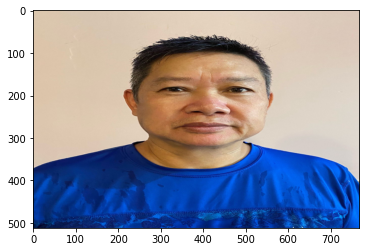

  0%|          | 0/38 [00:00<?, ?it/s]

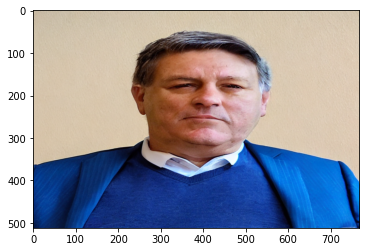

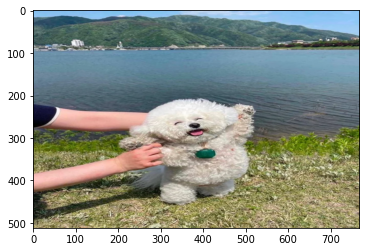

  0%|          | 0/38 [00:00<?, ?it/s]

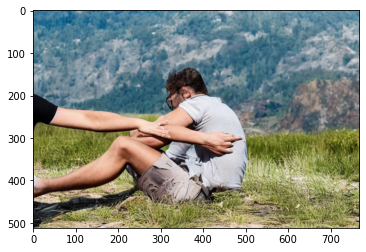

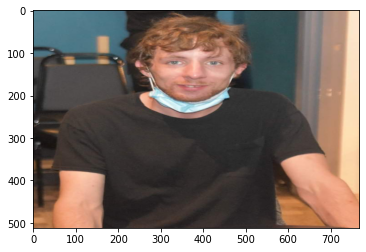

  0%|          | 0/38 [00:00<?, ?it/s]

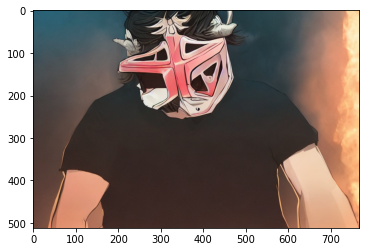

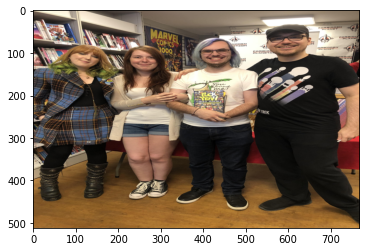

  0%|          | 0/38 [00:00<?, ?it/s]

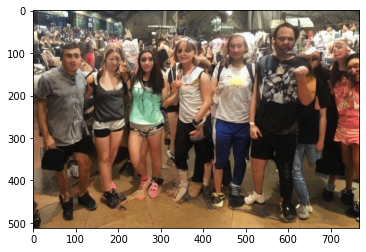

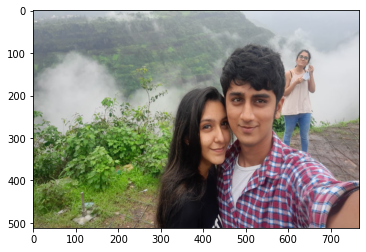

  0%|          | 0/38 [00:00<?, ?it/s]

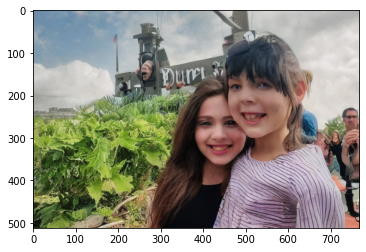

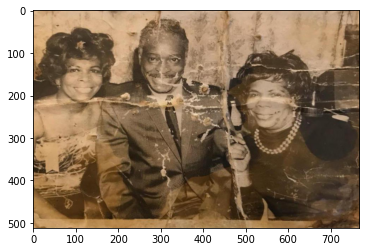

  0%|          | 0/38 [00:00<?, ?it/s]

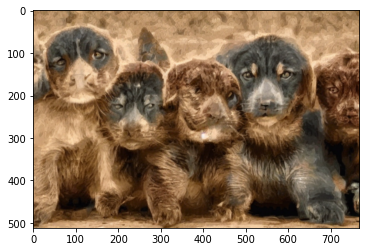

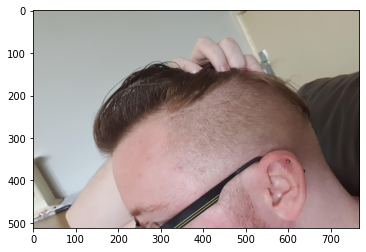

  0%|          | 0/38 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


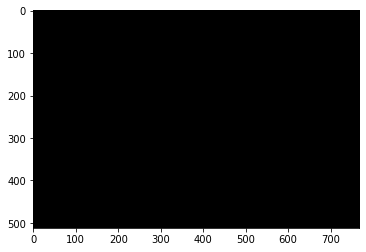

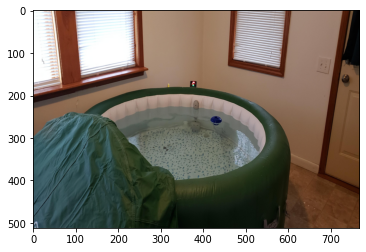

  0%|          | 0/38 [00:00<?, ?it/s]

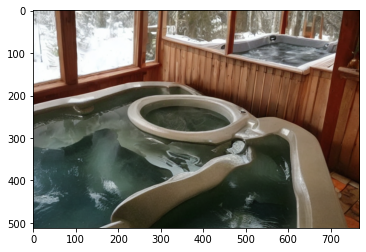

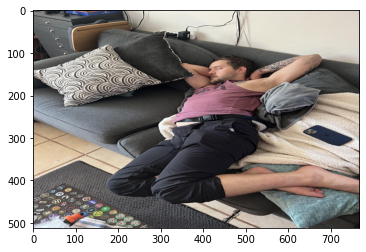

  0%|          | 0/38 [00:00<?, ?it/s]

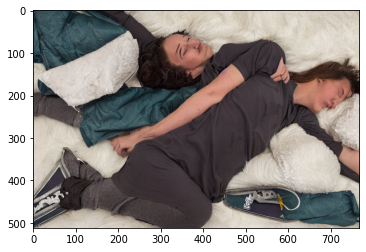

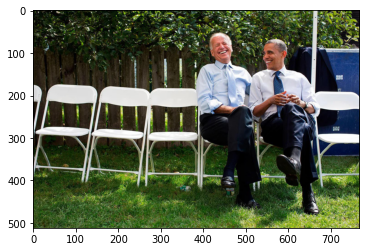

  0%|          | 0/38 [00:00<?, ?it/s]

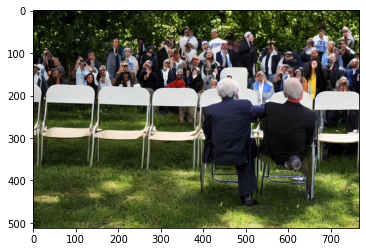

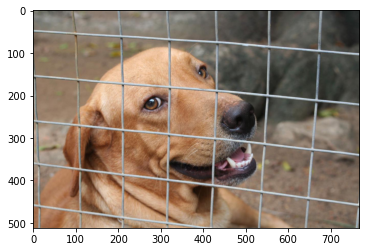

  0%|          | 0/38 [00:00<?, ?it/s]

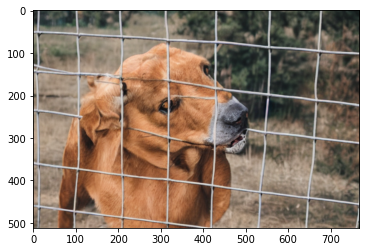

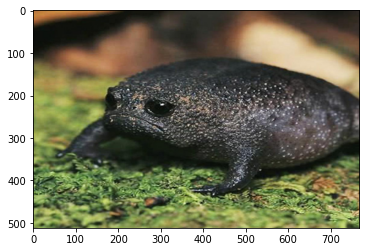

  0%|          | 0/38 [00:00<?, ?it/s]

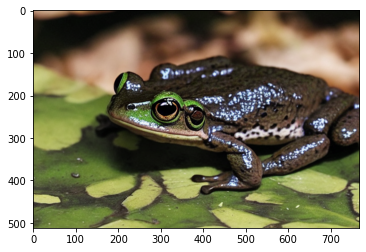

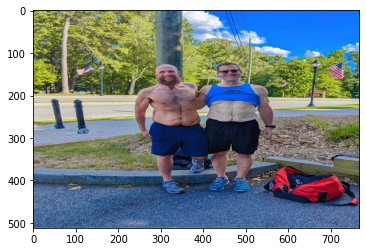

  0%|          | 0/38 [00:00<?, ?it/s]

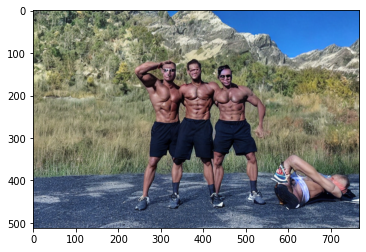

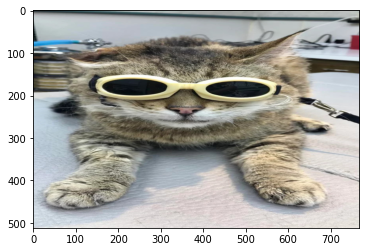

  0%|          | 0/38 [00:00<?, ?it/s]

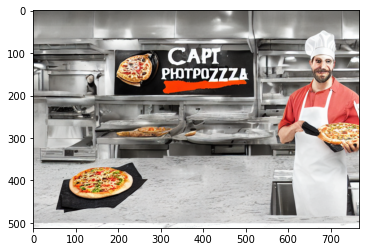

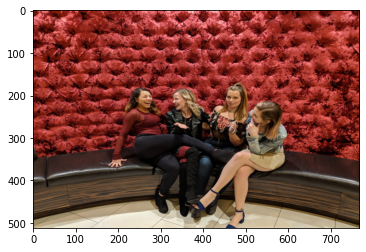

  0%|          | 0/38 [00:00<?, ?it/s]

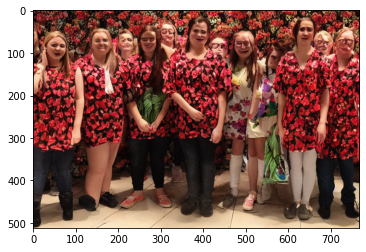

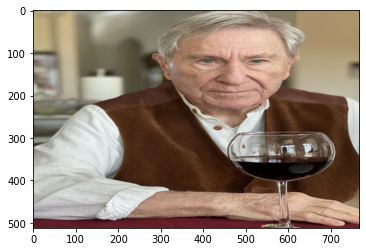

  0%|          | 0/38 [00:00<?, ?it/s]

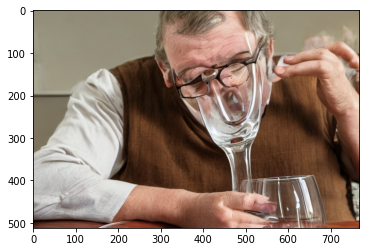

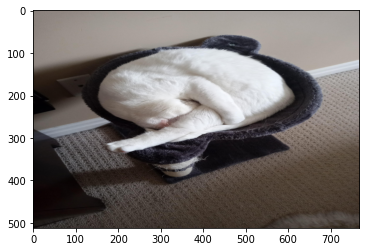

  0%|          | 0/38 [00:00<?, ?it/s]

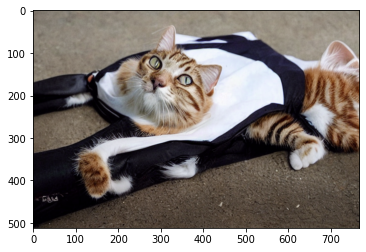

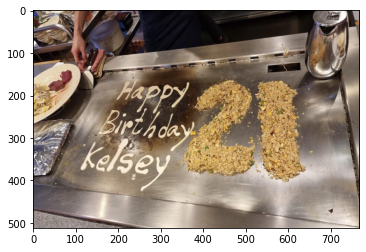

  0%|          | 0/38 [00:00<?, ?it/s]

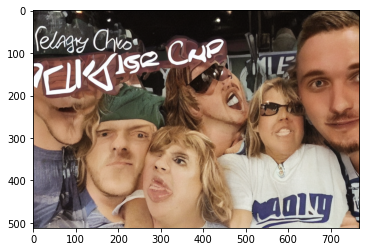

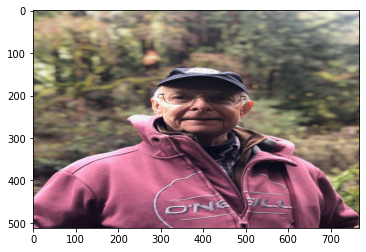

  0%|          | 0/38 [00:00<?, ?it/s]

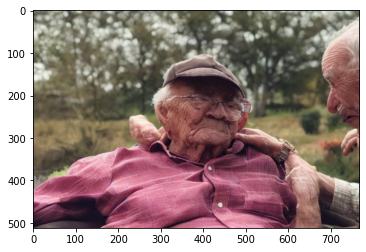

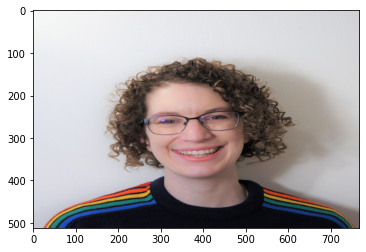

  0%|          | 0/38 [00:00<?, ?it/s]

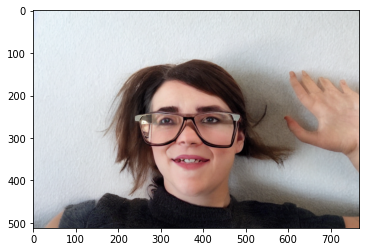

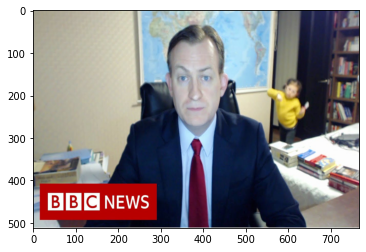

  0%|          | 0/38 [00:00<?, ?it/s]

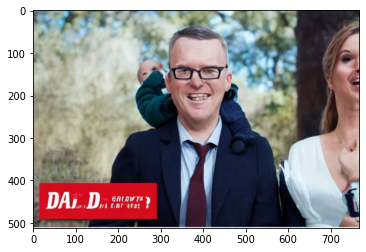

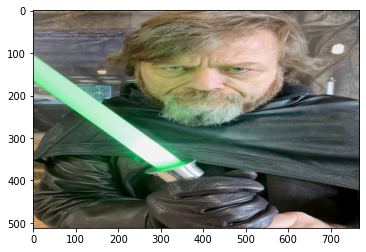

  0%|          | 0/38 [00:00<?, ?it/s]

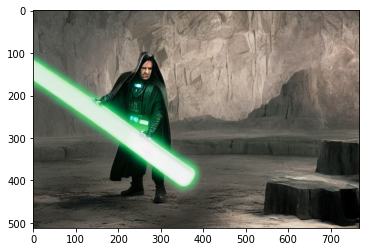

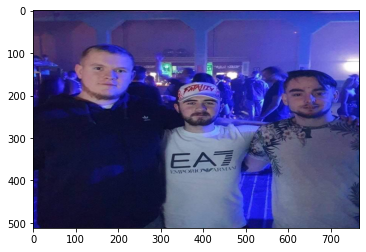

  0%|          | 0/38 [00:00<?, ?it/s]

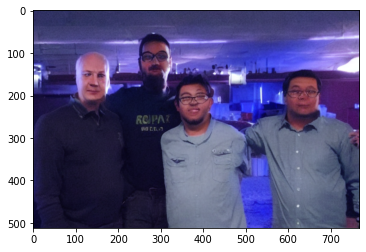

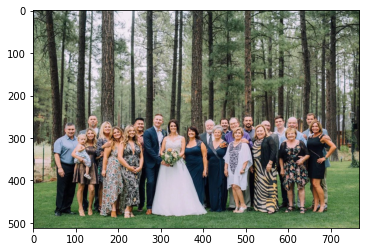

  0%|          | 0/38 [00:00<?, ?it/s]

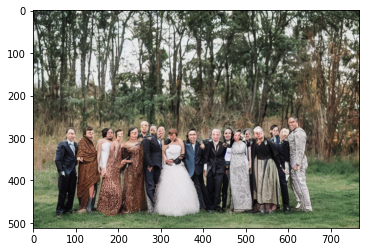

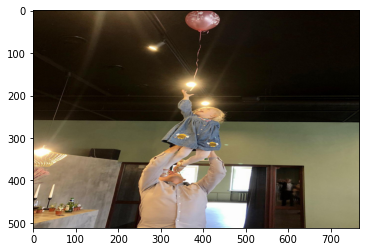

  0%|          | 0/38 [00:00<?, ?it/s]

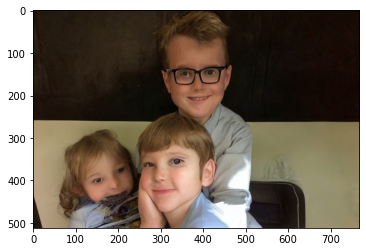

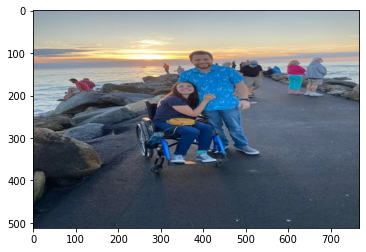

  0%|          | 0/38 [00:00<?, ?it/s]

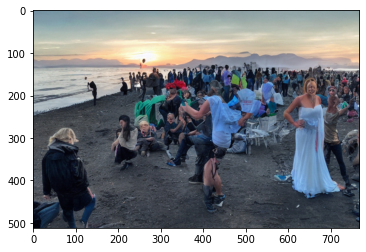

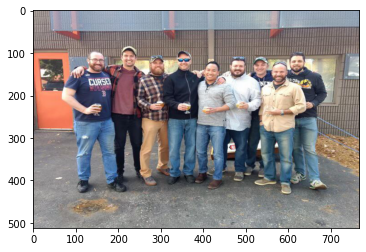

  0%|          | 0/38 [00:00<?, ?it/s]

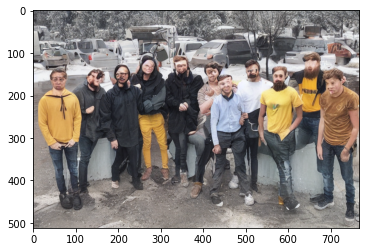

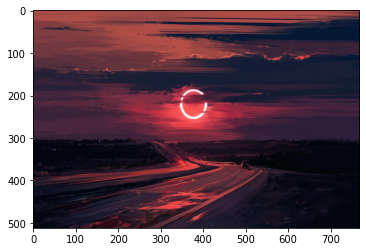

  0%|          | 0/38 [00:00<?, ?it/s]

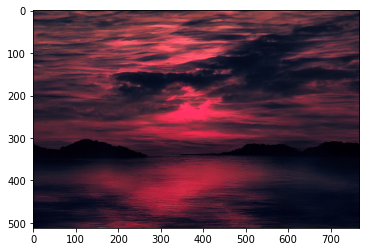

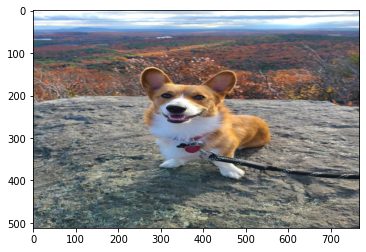

  0%|          | 0/38 [00:00<?, ?it/s]

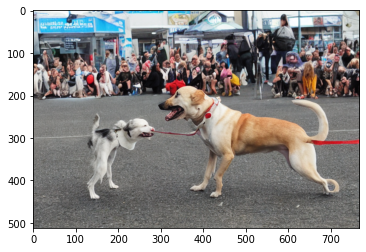

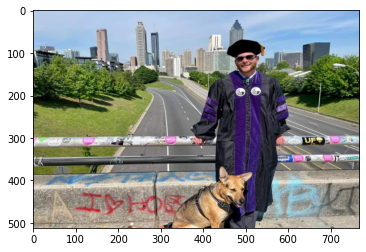

  0%|          | 0/38 [00:00<?, ?it/s]

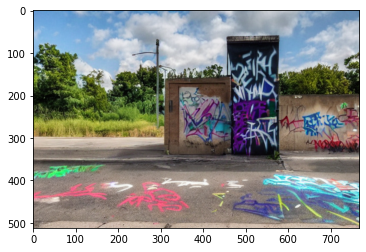

In [ ]:
for i in range(len(img_list)):
  img_path = 'Images/PreRequest/'+img_list[i]
  prompt = request_test_list[i]

  init_img = Image.open(img_path).convert("RGB")
  init_img = init_img.resize((768, 512))
  plt.imshow(init_img)
  plt.show()

  generator = torch.Generator(device=device).manual_seed(1024)
  with autocast("cuda"):
      image = pipe(prompt=prompt, init_image=init_img, strength=0.75, guidance_scale=7.5, generator=generator).images[0]
  plt.imshow(image)
  plt.show()
  #image.save('Images/stable_diffusion/'+img_list[i])